## Figures for _Cartographic Perspectives_ article
These generated with `weavingspace` version 0.0.7.19

In [1]:
import sys

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from weavingspace import WeaveUnit
from weavingspace import TileUnit
from weavingspace import TiledMap
from weavingspace import Tiling

import geopandas as gpd
import pandas as pd

qcols = ['#ffffff', '#eecc66', '#ee99aa', '#6699cc', '#997700', '#994455', '#004488', '#000000']

## Figure 1 motivating example

In [2]:
d = gpd.read_file("ak-imd/ak-imd-sa2-2018.json").to_crs(2193)
age_vars = [d for d in d.columns if d.startswith("age")][:-2]
ages = d[age_vars]
ranks = (
    (ages.rank(pct = True) > 0.5)
    .rename(columns = dict(zip(range(len(age_vars)), age_vars)))
    .astype(int)
    .assign(geometry = d.geometry)
    .set_geometry("geometry")
    .set_crs(d.crs)
)

In [3]:
tA = WeaveUnit(weave_type = "basket", strands = "ab|cd", aspect = 2/3,
               spacing = 200, crs = d.crs).transform_rotate(30)
tmA = Tiling(tA, d).get_tiled_map()

tB = (TileUnit(tiling_type = "hex-col", n = 7, spacing = 600, crs = d.crs)
      .transform_rotate(15)
      .transform_scale(0.96, 0.96, independent_of_tiling = True))
tmB = Tiling(tB, d).get_tiled_map()

In [4]:
import itertools

### NOTE:
### this functionality has been included in more recent versions of weavingspace
### via reg_prototiles attribute of Tiling class, and 
### get_regularised_prototiles_background() method
### HENCE                          
### bgB = tmB.tiling.get_regularised_prototiles_background()
### would now work
reg_prototiles = itertools.chain(*[
  tmB.tiling.tileable.regularised_prototile.geometry.translate(p.x, p.y)
  for p in tmB.tiling.grid.points])

bgB = gpd.GeoSeries([p for p in reg_prototiles
                    if p.intersects(tmB.tiling.region_union)])


In [5]:
tmA.legend = False
tmA.use_ellipse = True
tmA.ellipse_magnification = 0.8
tmA.vars_to_map = ["employment", "income", "housing", "health"]
tmA.ids_to_map = list("abcd")
tmA.colors_to_use = ["Greys", "Greens", "Purples", "Oranges"]
tmA.schemes_to_use = "quantiles"
tmA.n_classes = 25

tmB.legend = False
tmB.use_ellipse = True
tmB.ellipse_magnification = 0.85
tmB.vars_to_map = ["employment", "income", "housing", "health", 
                   "education", "accessibility", "crime"]
tmB.ids_to_map = list("abcdefg")
tmB.colors_to_use = "YlOrBr"
# tmB.schemes_to_use = "quantiles"
# tmB.n_classes = 25

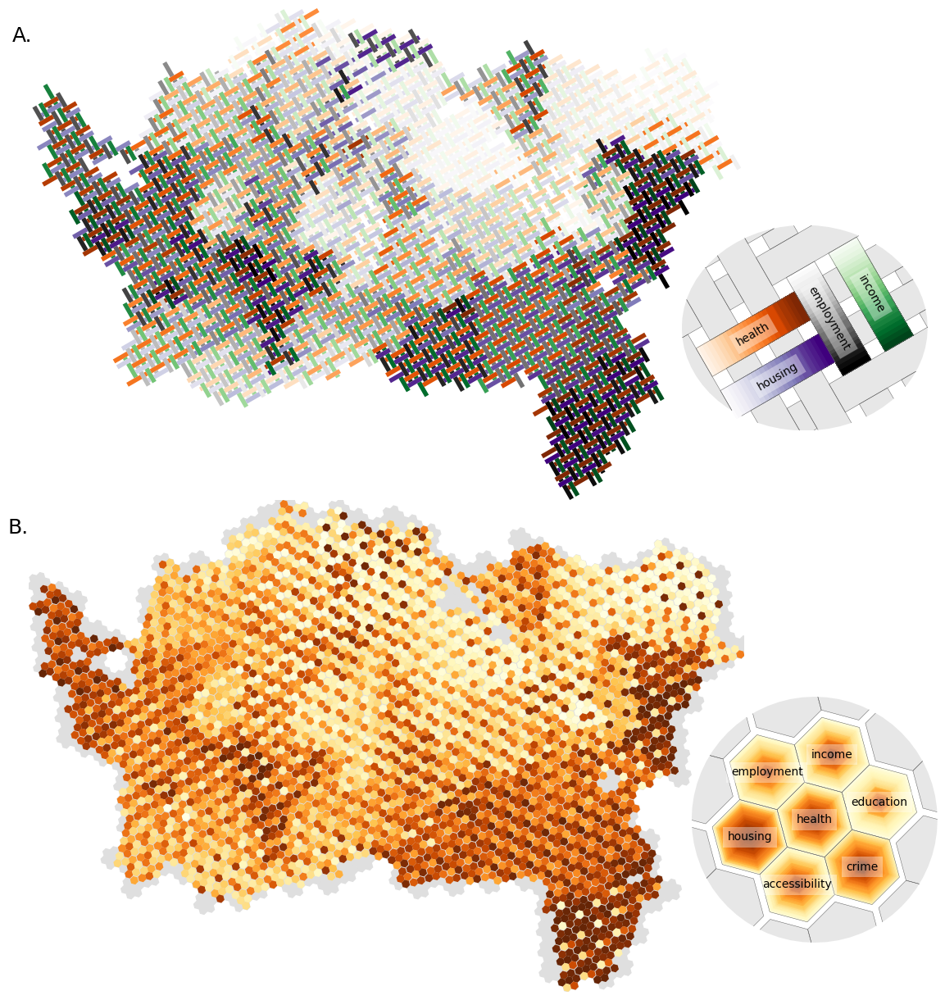

In [6]:
fig = plt.figure(
    figsize = (12, 12),
    # ncols = 2, nrows = 2,
    # layout = "constrained",
    # width_ratios = (3, 1)
)
ax1 = fig.add_axes([0, 0.5, 0.8, 0.5])
tmA._plot_map(ax1)
ax1.set_title("A.", x = 0.0, y = 0.95, fontsize = 18, 
             horizontalalignment = "right",
             verticalalignment = "top")
ax2 = fig.add_axes([0.7, 0.55, 0.25, 0.25])
tmA.plot_legend(ax2)
ax3 = fig.add_axes([0, 0, 0.8, 0.5])
bgB.plot(ax = ax3, fc = "#00000020", lw = 0)
tmB._plot_map(ax3)
ax3.set_title("B.", x = 0.0, y = 0.95, fontsize = 18, 
             horizontalalignment = "right",
             verticalalignment = "top")
ax4 = fig.add_axes([0.71, 0.05, 0.25, 0.25])
tmB.plot_legend(ax4)

# fig.savefig("fig-01-two-maps.png", dpi = 300, transparent = True)

## Figure 2 Anthromes

In [7]:
colours = pd.read_csv("anthromes/anthrome-colours.csv")
colour_lookup = dict(zip(colours.value, colours.hex_color))

land = gpd.read_file("anthromes/northeast-land.gpkg")

anthromes = gpd.read_file("anthromes/northeast-anthromes-v2.gpkg")

In [12]:
## THIS CELL IS SLOW TO RUN
t = (TileUnit(tiling_type = "hex-slice", n = 6, offset = 0, 
             spacing = 40_000, crs = anthromes.crs)
     .transform_scale(-1, 1)
     .inset_prototile(1200)
     .inset_tiles(300)
     .transform_rotate(-165))

tm = Tiling(t, anthromes).get_tiled_map()

## THIS IS THE SLOW PART!
tm.map = tm.map.clip(land)

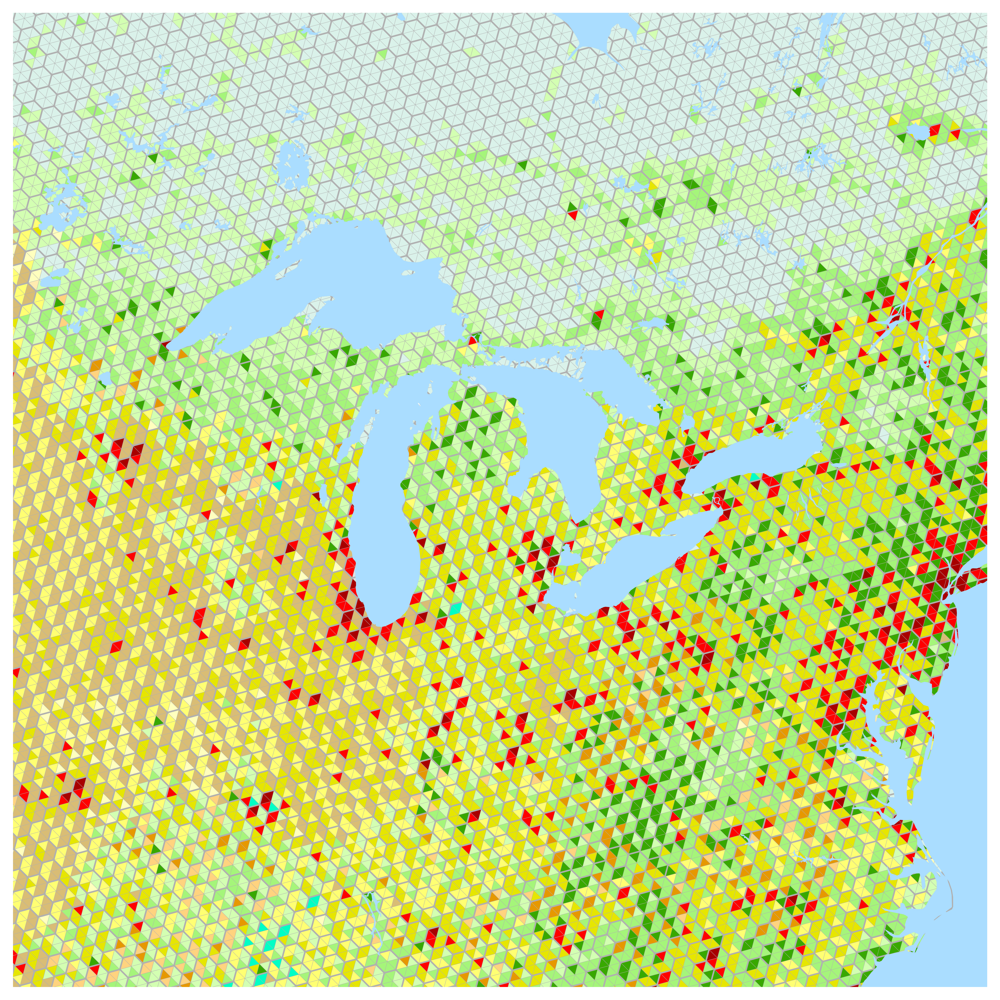

In [13]:
mm = 1 / 25.4
fig = plt.figure(figsize = (247*mm, 247*mm), dpi = 600)
ax = fig.add_subplot(111)
ax.set_xlim((0, 1.9e6))
ax.set_ylim((1.4e6, 3.3e6))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_facecolor("#aaddff")

land.plot(ax = ax, fc = "#b0b0b0", ec = "#00000000", lw = 0)

layers = tm.map.groupby("tile_id")
for id_, var in zip(list("abcdef"), 
                    ["1760AD", "1810AD", "1860AD", "1910AD", "1960AD", "2010AD"]):
    layer = layers.get_group(id_)
    layer.plot(ax = ax, lw = 0, 
               cmap = ListedColormap([colour_lookup[x] for x in layer[var]]))

# fig.savefig("anthromes/fig-02-anthromes-v4.png")

## Figure 3
Is a screenshot of the MapWeaver app

## Figure 4 Three twills

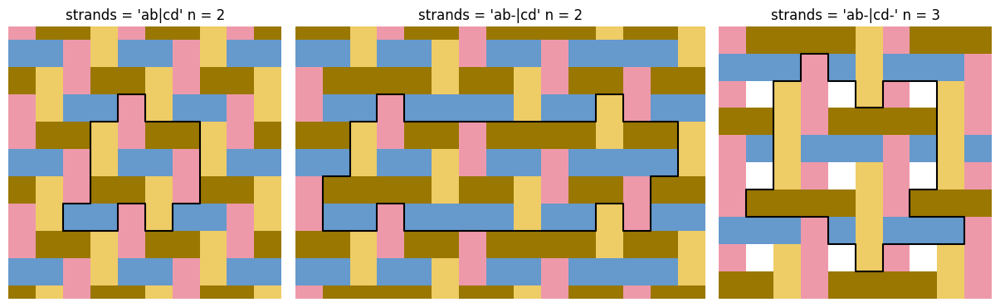

In [16]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, width_ratios = (2, 3, 2),
                         squeeze = False, layout = "constrained",
                         figsize = (12, 3.6))

strand_patterns = ["ab|cd", "ab-|cd", "ab-|cd-"]
over_unders = [2, 2, 3]
xlims = [(-5000, 5000), (-8000, 7000), (-5000, 5000)]
ylims = [(-4500, 5500), (-4500, 5500), (-5000, 5000)]

for i, (strands, over_under, xlim, ylim) in enumerate(zip(strand_patterns,
                                                          over_unders,
                                                          xlims, ylims)):
    ax = axes[i // 3, i % 3]
    (WeaveUnit(weave_type = "twill", strands = strands,
               n = over_under, aspect = 1)
        .plot(ax = ax, 
              r = 1, r_alpha = 1,
              show_prototile = False,
              reg_prototile_edgecolour = "black",
              show_ids = False,
              cmap = ListedColormap(qcols[1:5])))
    ax.set_title(f"{strands = } n = {over_under}")
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_axis_off()

# fig.savefig("fig-04-three-twills.png", dpi = 300, transparent = True)

## Figure 5 Rotate + Scale vs Scale + Skew

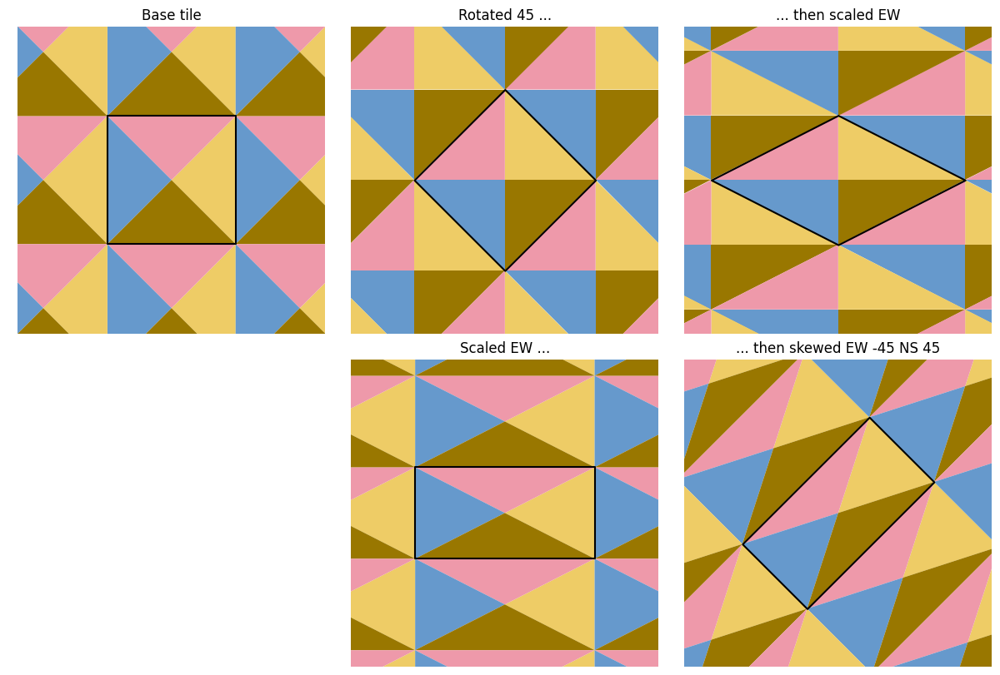

In [17]:
fig, axes = plt.subplots(nrows = 2, ncols = 3, squeeze = False,
                         layout = "constrained", figsize = (12, 8))
rotation = 45
xscale = 1.4
t = TileUnit(tiling_type = "square-slice", n = 4, offset = 0)
t1a = t.transform_rotate(rotation)
t1b = t1a.transform_scale(xscale, 1 / xscale)
t2a = t.transform_scale(xscale, 1 / xscale)
t2b = t2a.transform_skew(-rotation, rotation)
tiles = [t, t1a, t1b, None, t2a, t2b]
titles = [
    "Base tile", f"Rotated {rotation} ...", "... then scaled EW",
    None, "Scaled EW ...", f"... then skewed EW {-rotation} NS {rotation}"]
for i, (tile, title) in enumerate(zip(tiles, titles)):
    ax = axes[i // 3, i % 3]
    if tile is not None:
        tile.plot(ax = ax,
            r = 2, r_alpha = 1,
            show_prototile = False,
            reg_prototile_edgecolour = "k",
            show_ids = False,
              cmap = ListedColormap(qcols[1:5]))
        ax.set_title(title)
        ax.set_xlim((-1200, 1200))
        ax.set_ylim((-1200, 1200))
    ax.set_axis_off()

# fig.savefig("fig-05-rotate-scale-scale-skew.png", dpi = 300, transparent = True)

## Figure 6 Insets

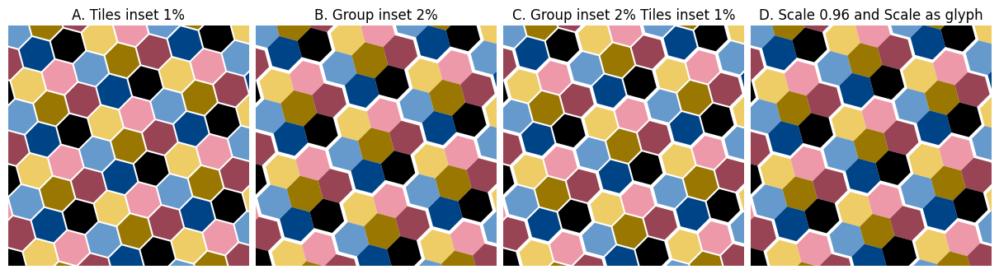

In [18]:
fig, axes = plt.subplots(nrows = 1, ncols = 4, squeeze = False,
                         layout = "constrained", figsize = (12, 3.3))

t = TileUnit(tiling_type = "hex-col", n = 7, spacing = 500).transform_rotate(15)
t1a = t.inset_tiles(5)
t1b = t.inset_prototile(10)
t1c = t.inset_tiles(5).inset_prototile(10)
t1d = t.transform_scale(0.96, 0.96, True)
tiles = [t1a, t1b, t1c, t1d]
titles = ["A. Tiles inset 1%", "B. Group inset 2%",
          "C. Group inset 2% Tiles inset 1%",
          "D. Scale 0.96 and Scale as glyph"]
for i, (tile, title) in enumerate(zip(tiles, titles)):
    ax = axes[i // 4, i % 4]
    if tile is not None:
        tile.plot(ax = ax,
            r = 2, r_alpha = 1,
            show_prototile = False,
            show_reg_prototile = False,
            show_ids = False,
              cmap = ListedColormap(qcols[1:8]))
        ax.set_title(title)
        ax.set_xlim((-700, 700))
        ax.set_ylim((-700, 700))
    ax.set_axis_off()

# fig.savefig("fig-06-insets.png", dpi = 300, transparent = True)

## Figure 7 Slice offsets

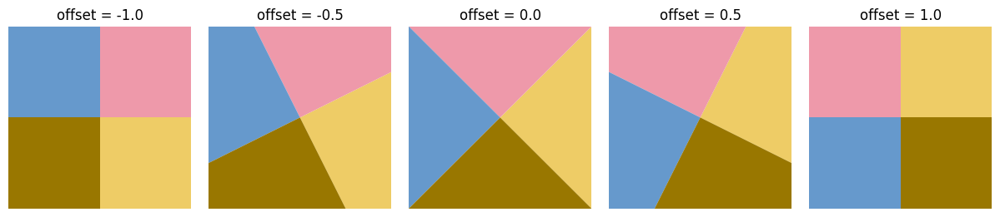

In [19]:
fig, axes = plt.subplots(nrows = 1, ncols = 5, squeeze = False,
                         layout = "constrained", figsize = (12, 2.5))
offsets = [x / 2 for x in range(-2, 3)]
tiles = [
    TileUnit(tiling_type = "square-slice", n = 4,
             offset = offset, spacing = 500)
    for offset in offsets]
titles = [f"{offset = }" for offset in offsets]
for i, (tile, title) in enumerate(zip(tiles, titles)):
    ax = axes[i // 5, i % 5]
    if tile is not None:
        tile.plot(ax = ax,
            r = 1, r_alpha = 1,
            show_prototile = False,
            show_reg_prototile = False,
            show_ids = False,
            cmap = ListedColormap(qcols[1:5]))
        ax.set_title(title)
        ax.set_xlim((-250, 250))
        ax.set_ylim((-250, 250))
    ax.set_axis_off()

# fig.savefig("fig-07-slice-offsets.png", dpi = 300, transparent = True)

## Figure 8 Star tiling point angle

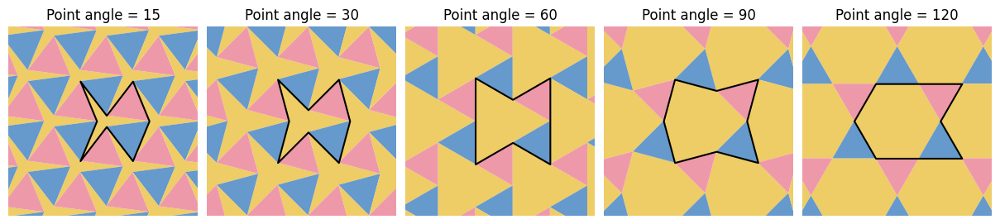

In [20]:
fig, axes = plt.subplots(nrows = 1, ncols = 5,
                         layout = "constrained", figsize = (12, 2.6))
point_angles = [15, 30, 60, 90, 120]
tiles = [
    TileUnit(tiling_type = "star1", code = "33",
             point_angle = point_angle, spacing = 500)
    for point_angle in point_angles]
titles = [f"Point angle = {point_angle}" for point_angle in point_angles]
for i, (tile, title) in enumerate(zip(tiles, titles)):
    ax = axes[i]
    if tile is not None:
        tile.plot(ax = ax,
            r = 3, r_alpha = 1,
            show_prototile = False,
            reg_prototile_edgecolour = "black",
            show_ids = False,
            cmap = ListedColormap(qcols[1:4]))
        ax.set_title(title)
        ax.set_xlim((-550, 550))
        ax.set_ylim((-550, 550))
    ax.set_axis_off()

# fig.savefig("fig-08-star-point-angles.png", dpi = 300, transparent = True)

## Figure 9 Dissection tileables, offset and inner angle

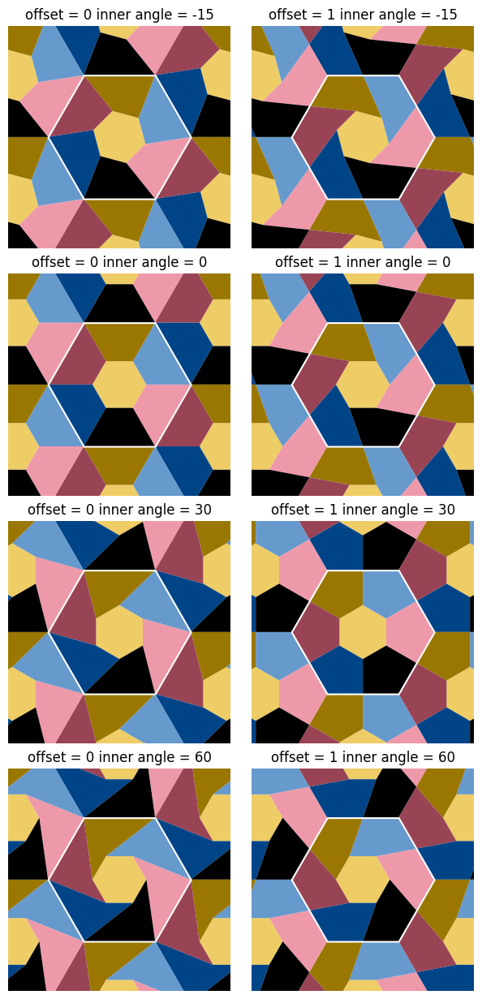

In [21]:
fig, axes = plt.subplots(nrows = 4, ncols = 2, squeeze = False,
                         layout = "constrained", figsize = (6, 12.2))
offset_angles = [-15, 0, 30, 60] * 2
offsets      = [0, 0, 0, 0, 1, 1, 1, 1]
tiles = [
    TileUnit(tiling_type = "hex-dissect", n = 7, offset = offset,
             offset_angle = offset_angle, spacing = 500)
    for offset, offset_angle in zip(offsets, offset_angles)]
titles = [f"{offset = } inner angle = {offset_angle}"
          for offset, offset_angle in zip(offsets, offset_angles)]
for i, (tile, title) in enumerate(zip(tiles, titles)):
    ax = axes[i % 4, i // 4]
    if tile is not None:
        tile.plot(ax = ax,
            r = 1, r_alpha = 1,
            show_prototile = False,
            reg_prototile_edgecolour = "w",
            show_ids = False,
            cmap = ListedColormap(qcols[1:8]))
        ax.set_title(title)
        ax.set_xlim((-450, 450))
        ax.set_ylim((-450, 450))
    ax.set_axis_off()

# fig.savefig("fig-09-dissection-options.png", dpi = 300, transparent = True)

## Figure 10 Weave unit over-unders

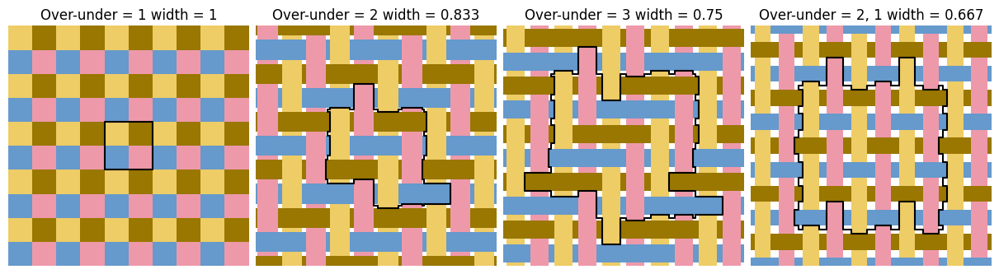

In [22]:
fig, axes = plt.subplots(nrows = 1, ncols = 4, width_ratios = (1, 1, 1, 1),
                         squeeze = False, layout = "constrained",
                         figsize = (12, 3.3))

over_unders = [(1, ), (2, ), (3, ), (2, 1)]
aspects = [1, 0.833, 0.75, 0.667]
xlims = [(-5000, 5000), (-5000, 5000), (-5000, 5000), (-5000, 5000)]
ylims = [(-5000, 5000), (-4500, 5500), (-5000, 5000), (-4500, 5500)]

for i, (over_under, aspect, xlim, ylim) in enumerate(zip(over_unders, aspects,
                                                         xlims, ylims)):
    ax = axes[i // 4, i % 4]
    (WeaveUnit(weave_type = "twill", strands = "ab|cd",
               n = over_under, aspect = aspect)
        .plot(ax = ax, 
              r = 2, r_alpha = 1,
              show_prototile = False,
              reg_prototile_edgecolour = "black",
              show_ids = False,
              cmap = ListedColormap(qcols[1:5])))
    ax.set_title(f"Over-under = {', '.join([str(_) for _ in over_under])} width = {aspect}")
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_axis_off()

# fig.savefig("fig-10-over-unders.png", dpi = 300, transparent = True)

## Figure 11 Further options

In [23]:
import shapely.geometry as geom

xmin, xmax, ymin, ymax = 1.752e6, 1.754e6, 5.9165e6, 5.9185e6
window = gpd.GeoDataFrame(
  geometry = gpd.GeoSeries([
      geom.Polygon([
            (xmin, ymin), 
            (xmin, ymax), 
            (xmax, ymax), 
            (xmax, ymin)])]), crs = d.crs)
d_ = window.overlay(d)

In [24]:
import copy

tC = (TileUnit(tiling_type = "square-slice", n = 2, offset = 0.5, spacing = 300, crs = d.crs)
      .transform_rotate(np.degrees(np.arctan(0.5)))
      .transform_scale(0.96, 0.96, independent_of_tiling = True)
      .inset_tiles(0))
tilingC = Tiling(tC, d_)
tmC1 = tilingC.get_tiled_map()
tmC1.map = tmC1.map.clip(window)
tmC2 = tilingC.get_tiled_map(join_on_prototiles = True)
tmC2.map = tmC2.map.clip(window)

tmC2_c = copy.deepcopy(tmC2)
tmC2_c.map.geometry = tmC2.map.geometry.centroid
overlaid_tiles = tmC1.map.sjoin(tmC2_c.map)
differences = gpd.GeoSeries([t for (inc1, inc2, hea1, hea2, t) in 
                             zip(overlaid_tiles.income_left, 
                                 overlaid_tiles.income_right,
                                 overlaid_tiles.health_left, 
                                 overlaid_tiles.health_right,
                                 tmC1.map.geometry) if inc1 != inc2 or hea1 != hea2])


prototiles = tilingC.prototiles.clip(window)
tiles = tilingC.tiles.clip(window)

/Users/david/Documents/research/Papers/practical-cartography-corner/.venv/lib/python3.12/site-packages/shapely/constructive.py:1353: RuntimeWarning: divide by zero encountered in oriented_envelope
  return lib.oriented_envelope(geometry, **kwargs)
/Users/david/Documents/research/Papers/practical-cartography-corner/.venv/lib/python3.12/site-packages/shapely/constructive.py:1353: RuntimeWarning: invalid value encountered in oriented_envelope
  return lib.oriented_envelope(geometry, **kwargs)


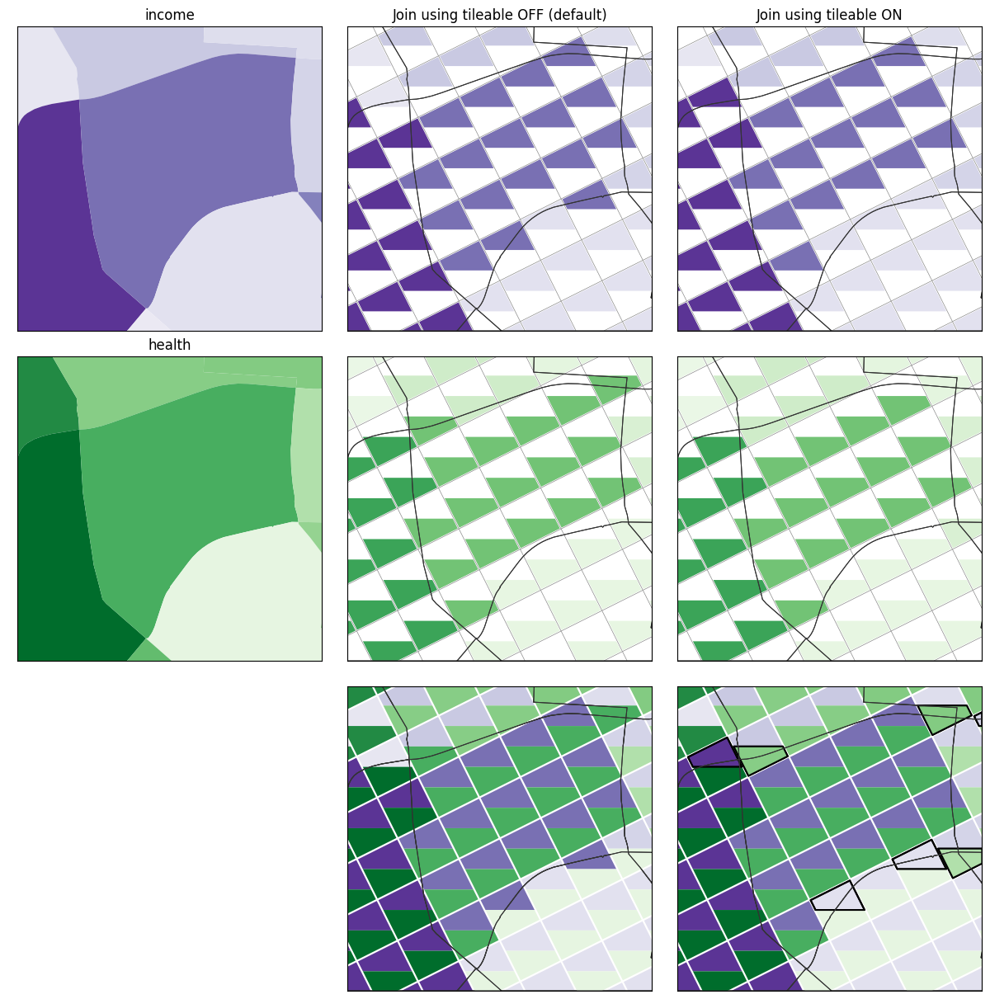

In [25]:
fig, axes = plt.subplots(3, 3, figsize = (12, 12), layout = "constrained")
variables = ["income", "health"]
cmaps = ["Purples", "Greens"]
tile_ids = ["a", "b"]
vmins = [1400, 1600]
vmaxs = [4300, 5000]

for r in range(3):
    for c in range(3):
        ax = axes[r, c]
        tm = tmC2 if c == 2 else tmC1
        variables_ = variables # [r:r+1] if r < 2 else variables
        cmaps_ = cmaps[r:r+1] if r < 2 else cmaps
        vmins_ = vmins[r:r+1] if r < 2 else vmins
        vmaxs_ = vmaxs[r:r+1] if r < 2 else vmaxs
        tile_ids_ = tile_ids[r:r+1] if r < 2 else tile_ids
        if c == 0:
            if r < 2:
                # basemap of each variable alone
                d_.plot(ax = ax, column = variables_[r], cmap = cmaps_[0], vmin = vmins_[0], vmax = vmaxs_[0])
                # prototiles.plot(ax = ax, fc = "#00000000", ec = "#999999", linewidth = 0.35)
                # tiles.plot(ax = ax, fc = "#00000000", ec = "#999999", linewidth = 0.15)
                ax.set_title(variables_[r])
            else:
                ax.set_axis_off()
        else:
            for tile_id, column, cmap, vmin, vmax in zip(tile_ids_, variables_, cmaps_, vmins_, vmaxs_):
                tm.map[tm.map.tile_id == tile_id].plot(ax = ax, column = column, cmap = cmap, linewidth = 0, vmin = vmin, vmax = vmax)
                if r == 2 and c == 2:
                    differences.plot(ax = ax, fc = "#00000000", ec = "k", linewidth = 1.5)
                if r < 2:
                    prototiles.plot(ax = ax, fc = "#00000000", ec = "#999999", linewidth = 0.35)
                d_.plot(ax = ax, fc = "#00000000", ec = "#333333", linewidth = 0.75)
                if r == 0:
                    ax.set_title("Join using tileable OFF (default)" if c == 1 else "Join using tileable ON")
                elif r == 2:
                    ax.set_title(" ")
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_xticks([])
        ax.set_yticks([])

# plt.savefig("fig-11-other-options.png", dpi = 300, transparent = True)